In [1]:
%cd ..
%ls

/home/nas3_userJ/dmkim/OnlineTSAD
cfgs/         data/  Exp/     logs/    outputs/  results/  train.py*  Vis/
checkpoints/  EDA/   hptune/  models/  plots/    test.py*  utils/     wandb/


In [2]:
import torch
from torch import optim
import torch.nn.functional as F

import matplotlib.pyplot as plt

from utils.metrics import get_summary_stats

from models.MLP import MLP

import wandb
import hydra
from omegaconf import DictConfig

from utils.logger import make_logger
from utils.argpass import prepare_arguments, configure_exp_id
from utils.tools import SEED_everything, plot_interval

import warnings
from data.load_data import DataFactory
from Exp.ReconBaselines import *

from easydict import EasyDict as edict
import yaml
import re
import copy

warnings.filterwarnings("ignore")

In [3]:
# load yaml
cfg = {}
loader = yaml.SafeLoader
loader.add_implicit_resolver(
    u'tag:yaml.org,2002:float',
    re.compile(u'''^(?:
     [-+]?(?:[0-9][0-9_]*)\\.[0-9_]*(?:[eE][-+]?[0-9]+)?
    |[-+]?(?:[0-9][0-9_]*)(?:[eE][-+]?[0-9]+)
    |\\.[0-9_]+(?:[eE][-+][0-9]+)?
    |[-+]?[0-9][0-9_]*(?::[0-5]?[0-9])+\\.[0-9_]*
    |[-+]?\\.(?:inf|Inf|INF)
    |\\.(?:nan|NaN|NAN))$''', re.X),
    list(u'-+0123456789.'))

# get cfg
model = "MLP"
with open("cfgs/test_defaults.yaml", "r") as file:
    basic_config = yaml.load(file, Loader=loader)
    cfg.update(basic_config)
with open(f"cfgs/model/{model}.yaml", "r") as file:
    model_config = yaml.load(file, Loader=loader)
    cfg.update({"model": model_config})
cfg['dataset'] = 'NeurIPS-TS-MUL'
cfg["RevIN"] = 'ARevIN'
cfg["gamma"] = 0.5

In [4]:
args = prepare_arguments(cfg)
args.model.latent_dim = 128
args.window_size = 12
args.eval_batch_size = 1
args.dataset = "NeurIPS-TS-MUL"
print(args)

logger = make_logger(os.path.join(args.log_path, f'{args.exp_id}.log'))
logger.info(f"Configurations: {args}")

# Data
logger.info(f"Preparing {args.dataset} dataset...")
datafactory = DataFactory(args, logger)
train_dataset, train_loader, test_dataset, test_loader = datafactory()
args.num_channels = train_dataset.X.shape[1]
train_X, train_y, test_X, test_y = train_dataset.X, train_dataset.y, test_dataset.X, test_dataset.y

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

[2023-04-11 12:47:00,178] Configurations: {'exp_id': 'MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'infer_options': ['offline', 'online_us_bce_seq'], 'dataset': 'NeurIPS-TS-MUL', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 1, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'TT_loss': 'bce', 'cls_lambda': 1, 'ttlr': 0.001, 'thlr': 0.001, 'use_RevIN': True, 'gamma': 0.5, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'log_path': './logs/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'output_path': './outputs/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'plot_path': './plots/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'result_path': './results/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'RevIN': 'ARevIN', 'home_dir': '.', 'device': device(type='cuda')}
[2023-04-11 12:47:00,179] Preparing NeurIPS-TS-MUL data

{'exp_id': 'MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'infer_options': ['offline', 'online_us_bce_seq'], 'dataset': 'NeurIPS-TS-MUL', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 1, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'TT_loss': 'bce', 'cls_lambda': 1, 'ttlr': 0.001, 'thlr': 0.001, 'use_RevIN': True, 'gamma': 0.5, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'log_path': './logs/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'output_path': './outputs/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'plot_path': './plots/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'result_path': './results/MLP_NeurIPS-TS-MUL_RevIN_ARevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 128}, 'RevIN': 'ARevIN', 'home_dir': '.', 'device': device(type='cuda')}
(1000, 5) (1000,) (996, 5) (996,)


## Visualize

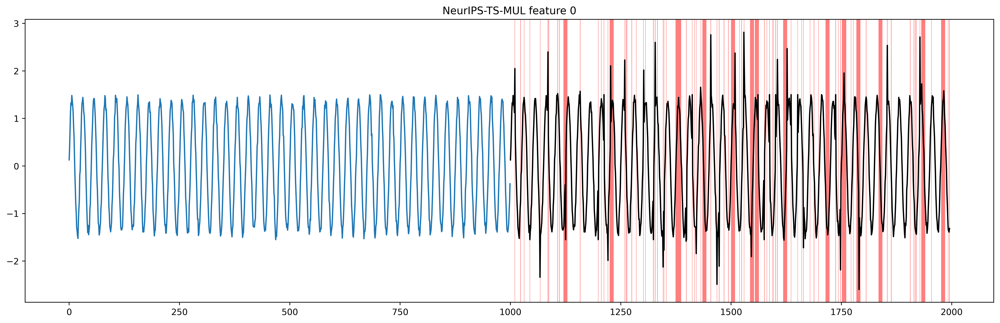

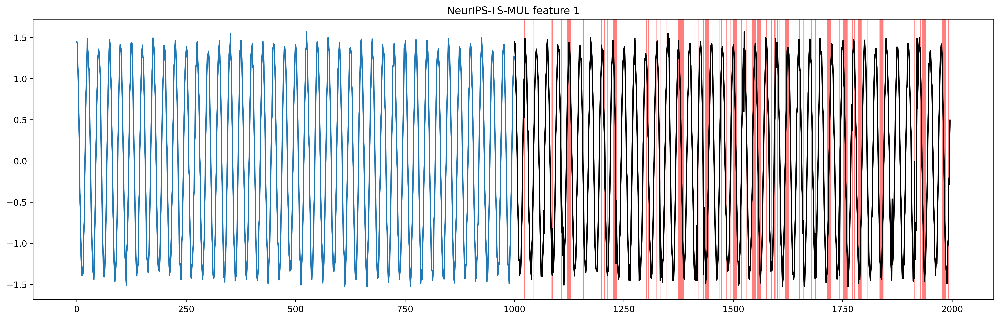

KeyboardInterrupt: 

In [22]:
for c in range(args.num_channels):
    dataset_name = "NeurIPS-TS-MUL"
    plt.figure(figsize=(20, 6), dpi=500)
    plt.plot(train_X[:, c], color="C0")
    plt.plot(range(len(train_X), len(train_X)+len(test_X)), test_X[:, c], color="black")
    label = np.concatenate([np.array([0]*len(train_X)), test_y])
    plot_interval(plt, label)
    plt.title(f"{dataset_name} feature {c}")
    plt.show()

## Load Model

In [5]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN", f"best.pth"))

[2023-04-11 12:47:23,377] loading: ./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-11 12:47:23,392] train_errors.pt file exists, loading...
[2023-04-11 12:47:23,416] torch.Size([989, 12])
[2023-04-11 12:47:23,418] test_errors.pt file exists, loading...
[2023-04-11 12:47:23,437] torch.Size([83, 12])
[2023-04-11 12:47:23,448] Best threshold found at: 0.02632828988134861, with fpr: 0.35271317829457366, tpr: 0.8288288288288288
tn: 501 fn: 38
fp: 273 tp: 184
[2023-04-11 12:47:23,450] loading: ./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN/best.pth @Trainer - torch.load_state_dict


In [6]:
next(iter(tester.model.parameters())).device, next(iter(tester.model.parameters())).requires_grad

(device(type='cuda', index=0), True)

In [7]:
tester.model.state_dict()

OrderedDict([('encoder.linear1.weight',
              tensor([[ 0.0172,  0.0095, -0.0412,  ..., -0.0314, -0.0191,  0.0897],
                      [ 0.0727,  0.0442,  0.0224,  ...,  0.0677,  0.0683, -0.1683],
                      [ 0.0876,  0.1112,  0.1232,  ..., -0.0582,  0.0035, -0.0273],
                      ...,
                      [ 0.0654, -0.1419,  0.0011,  ...,  0.0053,  0.0281, -0.1397],
                      [-0.0546,  0.1556,  0.1628,  ...,  0.0872, -0.1795, -0.1100],
                      [ 0.1413,  0.1418,  0.1537,  ..., -0.1291, -0.1603, -0.0467]],
                     device='cuda:0')),
             ('encoder.linear1.bias',
              tensor([ 0.0411,  0.1445, -0.0318,  0.1118,  0.1912, -0.0202,  0.1062,  0.1644,
                       0.1687,  0.0411, -0.1258, -0.0561,  0.0056,  0.0208, -0.0094,  0.0101,
                      -0.0140,  0.1710, -0.0027,  0.1094,  0.1333,  0.0239,  0.1772, -0.0909,
                      -0.0675, -0.0489,  0.0395, -0.0088,  0.1442,  

## Training statistics

In [8]:
train_iterator = tqdm(
    tester.train_loader,
    total=len(tester.train_loader),
    desc="calculating reconstruction errors",
    leave=True
)

recon_errors = []
with torch.no_grad():
    for i, batch_data in enumerate(train_iterator):
        X = batch_data[0].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        recon_error = torch.nn.functional.mse_loss(Xhat, X, reduction='none')
        recon_errors.append(recon_error)

recon_errors = torch.cat(recon_errors, axis=0)

train_error_dist = recon_errors.mean(dim=(1, 2))

print(f"{recon_errors.shape}, {train_error_dist.shape}")

calculating reconstruction errors: 100%|██████████| 16/16 [00:01<00:00, 11.30it/s]

torch.Size([989, 12, 5]), torch.Size([989])


## Test: static threshold inference

In [9]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

anoscs_prev = []
Xhats_prev = []
with torch.no_grad():
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        Xhats_prev.append(Xhat)        
        e = F.mse_loss(Xhat, X, reduction='none')
        anosc = e.mean(dim=2)
        anoscs_prev.append(anosc)

Xhats_prev = torch.cat(Xhats_prev, axis=0).detach().cpu().numpy()
anoscs_prev = torch.cat(anoscs_prev, axis=0).reshape(-1).detach().cpu().numpy()

calculating reconstruction errors: 100%|██████████| 83/83 [00:00<00:00, 721.23it/s]


In [10]:
th_q95 = torch.quantile(train_error_dist, 0.95).item()
th_q99 = torch.quantile(train_error_dist, 0.99).item()
th_q100 = torch.max(train_error_dist).item()
th_best_static = tester.get_best_static_threshold(gt=test_y, anomaly_scores=anoscs_prev)
th_q95, th_q99, th_q100, th_best_static

[2023-04-11 12:47:50,968] Best threshold found at: 0.017831159755587578, with fpr: 0.35271317829457366, tpr: 0.8558558558558559
tn: 501 fn: 32
fp: 273 tp: 190


(0.006636809557676315, 0.007544714491814375, 0.008719767443835735, 0.01783116)

In [12]:
# 95
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q95))
# 99
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q99))
# 100
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q100))
# oracle
print(get_summary_stats(test_dataset.y, anoscs_prev > th_best_static))

{'Accuracy': 0.5371485943775101, 'Precision': 0.31921331316187596, 'Recall': 0.9504504504504504, 'F1': 0.477916194790487, 'tn': 324, 'fp': 450, 'fn': 11, 'tp': 211}
{'Accuracy': 0.5622489959839357, 'Precision': 0.329073482428115, 'Recall': 0.9279279279279279, 'F1': 0.4858490566037736, 'tn': 354, 'fp': 420, 'fn': 16, 'tp': 206}
{'Accuracy': 0.5983935742971888, 'Precision': 0.3470790378006873, 'Recall': 0.9099099099099099, 'F1': 0.5024875621890547, 'tn': 394, 'fp': 380, 'fn': 20, 'tp': 202}
{'Accuracy': 0.6927710843373494, 'Precision': 0.4090909090909091, 'Recall': 0.8513513513513513, 'F1': 0.5526315789473684, 'tn': 501, 'fp': 273, 'fn': 33, 'tp': 189}


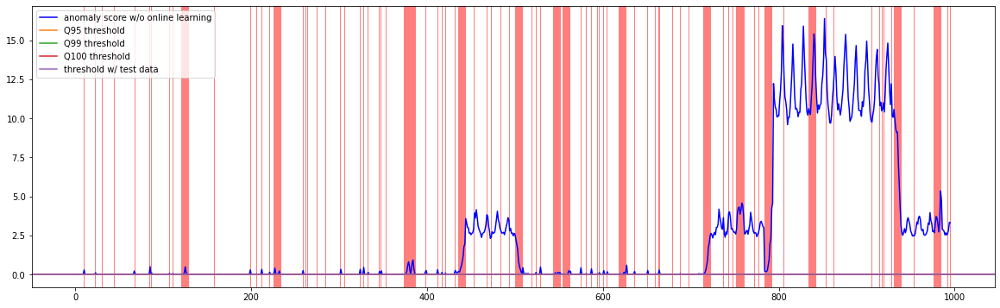

In [13]:
plt.figure(figsize=(20, 6))
#lt.ylim([-2, 5])
plt.plot(anoscs_prev, color="blue", label="anomaly score w/o online learning")
#plt.plot(anoscs, color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="C1", label="Q95 threshold")
plt.axhline(th_q99, color="C2", label="Q99 threshold")
plt.axhline(th_q100, color="C3", label="Q100 threshold")
plt.axhline(th_best_static, color="C4", label="threshold w/ test data")

#plt.plot(thrs, color="gold",label="dynamic threshold")
plt.legend()
plot_interval(plt, test_y)
plt.show()

## Value-based Pseudo-label guided Online Learning (separate threshold)

### 1. Single+CE

In [75]:
thr = torch.quantile(train_error_dist, 0.95).detach().item() + 0.1
thr = torch.tensor(thr, requires_grad=True)
thr

tensor(0.1066, requires_grad=True)

In [76]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN", f"best.pth"))

[2023-04-11 13:26:13,441] loading: ./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-11 13:26:13,451] train_errors.pt file exists, loading...
[2023-04-11 13:26:13,455] torch.Size([989, 12])
[2023-04-11 13:26:13,459] test_errors.pt file exists, loading...
[2023-04-11 13:26:13,462] torch.Size([83, 12])
[2023-04-11 13:26:13,466] Best threshold found at: 0.02632828988134861, with fpr: 0.35271317829457366, tpr: 0.8288288288288288
tn: 501 fn: 38
fp: 273 tp: 184
[2023-04-11 13:26:13,467] loading: ./checkpoints/MLP_NeurIPS-TS-MUL_RevIN_ARevIN/best.pth @Trainer - torch.load_state_dict


In [77]:
tester.model.revin.mean

Parameter containing:
tensor([[[ 0.0024, -0.0066,  0.0030, -0.0067,  0.0025]]], device='cuda:0')

In [78]:
tester.model.revin.gamma = 0.5
tester.model.revin.gamma

0.5

In [79]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-01
TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)
TH_optimizer = torch.optim.SGD([thr], lr=5e-02)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    #import pdb;pdb.set_trace();
    tester.model.revin._update_statistics(X)
    
    Xhat = tester.model(X)
    print(tester.model.revin.mean)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr.clone().detach().item())
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (A*mask).mean()
    recon_loss.backward()
    TT_optimizer.step()
    
    # update threshold
    TH_optimizer.zero_grad()
    Xhat = tester.model(X)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    yhat = torch.sigmoid((A-thr))
    cls_loss = bce(yhat, ytilde)
    cls_loss.backward()
    
    print(thr, thr.grad)
    TH_optimizer.step()
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

calculating reconstruction errors:  24%|██▍       | 20/83 [00:00<00:00, 98.09it/s]

Parameter containing:
tensor([[[0.5408, 0.0873, 0.4495, 0.0836, 0.4633]]], device='cuda:0')
tensor(0.1066, requires_grad=True) tensor(-0.1746)
Parameter containing:
tensor([[[-0.1728, -0.1302, -0.2218, -0.1210, -0.2263]]], device='cuda:0')
tensor(0.1154, requires_grad=True) tensor(-0.4863)
Parameter containing:
tensor([[[0.3436, 0.1438, 0.3287, 0.1452, 0.3221]]], device='cuda:0')
tensor(0.1397, requires_grad=True) tensor(-0.3924)
Parameter containing:
tensor([[[-0.2331, -0.1625, -0.2238, -0.1647, -0.2255]]], device='cuda:0')
tensor(0.1593, requires_grad=True) tensor(-0.3176)
Parameter containing:
tensor([[[0.2344, 0.2190, 0.2430, 0.2110, 0.2417]]], device='cuda:0')
tensor(0.1752, requires_grad=True) tensor(-0.0372)
Parameter containing:
tensor([[[-0.2630, -0.2649, -0.1874, -0.2494, -0.2032]]], device='cuda:0')
tensor(0.1770, requires_grad=True) tensor(-0.3833)
Parameter containing:
tensor([[[0.1361, 0.2383, 0.1922, 0.2530, 0.1387]]], device='cuda:0')
tensor(0.1962, requires_grad=True) 

calculating reconstruction errors:  40%|███▉      | 33/83 [00:00<00:00, 111.12it/s]

Parameter containing:
tensor([[[-0.2905,  0.1101, -0.2957,  0.1312, -0.2901]]], device='cuda:0')
tensor(0.3821, requires_grad=True) tensor(-0.4105)
Parameter containing:
tensor([[[ 0.3361, -0.0977,  0.2902, -0.0702,  0.2989]]], device='cuda:0')
tensor(0.4026, requires_grad=True) tensor(-0.3394)
Parameter containing:
tensor([[[-0.2988,  0.0419, -0.3131,  0.0375, -0.3064]]], device='cuda:0')
tensor(0.4196, requires_grad=True) tensor(-0.4021)
Parameter containing:
tensor([[[ 0.3304, -0.0306,  0.3055,  0.0020,  0.3010]]], device='cuda:0')
tensor(0.4397, requires_grad=True) tensor(-0.1901)
Parameter containing:
tensor([[[-0.2908, -0.0443, -0.3097, -0.0279, -0.3098]]], device='cuda:0')
tensor(0.4492, requires_grad=True) tensor(-0.3934)
Parameter containing:
tensor([[[0.3692, 0.0541, 0.3118, 0.0647, 0.3071]]], device='cuda:0')
tensor(0.4689, requires_grad=True) tensor(-0.3852)
Parameter containing:
tensor([[[-0.2746, -0.1327, -0.2907, -0.1281, -0.2881]]], device='cuda:0')
tensor(0.4881, requi

calculating reconstruction errors:  73%|███████▎  | 61/83 [00:00<00:00, 105.64it/s]

tensor(0.8198, requires_grad=True) tensor(-0.3195)
Parameter containing:
tensor([[[ 0.3353,  0.0180,  0.3140, -0.0047,  0.2680]]], device='cuda:0')
tensor(0.8357, requires_grad=True) tensor(-0.0017)
Parameter containing:
tensor([[[-0.3137,  0.0368, -0.3179, -0.0332, -0.3483]]], device='cuda:0')
tensor(0.8358, requires_grad=True) tensor(-0.3096)
Parameter containing:
tensor([[[0.3652, 0.1052, 0.2908, 0.0717, 0.3023]]], device='cuda:0')
tensor(0.8513, requires_grad=True) tensor(-0.3136)
Parameter containing:
tensor([[[-0.2680, -0.0979, -0.2781, -0.0936, -0.2988]]], device='cuda:0')
tensor(0.8670, requires_grad=True) tensor(-0.3036)
Parameter containing:
tensor([[[0.3603, 0.1506, 0.3080, 0.1409, 0.2742]]], device='cuda:0')
tensor(0.8822, requires_grad=True) tensor(-0.3172)
Parameter containing:
tensor([[[-0.1647, -0.1748, -0.2451, -0.1681, -0.2631]]], device='cuda:0')
tensor(0.8980, requires_grad=True) tensor(-0.3173)
Parameter containing:
tensor([[[0.3290, 0.2149, 0.2344, 0.2284, 0.2385]

calculating reconstruction errors: 100%|██████████| 83/83 [00:00<00:00, 106.62it/s]

tensor(1.0695, requires_grad=True) tensor(-0.2632)
Parameter containing:
tensor([[[ 0.0905, -0.2870,  0.1684, -0.2408, -3.1398]]], device='cuda:0')
tensor(1.0827, requires_grad=True) tensor(-0.0614)
Parameter containing:
tensor([[[-0.2347,  0.2355, -0.2015,  0.2520, -5.7156]]], device='cuda:0')
tensor(1.0858, requires_grad=True) tensor(0.0564)
Parameter containing:
tensor([[[ 0.2137, -0.2458,  0.2244, -0.2187, -6.7523]]], device='cuda:0')
tensor(1.0829, requires_grad=True) tensor(-0.3049)
Parameter containing:
tensor([[[-0.2506,  0.1661, -0.2544,  0.1840, -7.9648]]], device='cuda:0')
tensor(1.0982, requires_grad=True) tensor(-0.2581)
Parameter containing:
tensor([[[ 0.2808, -0.1775,  0.2731,  0.0598, -7.8305]]], device='cuda:0')
tensor(1.1111, requires_grad=True) tensor(-0.2722)
Parameter containing:
tensor([[[-0.2861,  0.1091, -0.2811,  0.5139, -8.5621]]], device='cuda:0')
tensor(1.1247, requires_grad=True) tensor(-0.2628)
Parameter containing:
tensor([[[ 0.3514, -0.0532,  0.3087,  0.

In [80]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

(996,) (996,)
{'Accuracy': 0.7560240963855421, 'Precision': 0.3894736842105263, 'Recall': 0.16666666666666666, 'F1': 0.2334384858044164, 'tn': 716, 'fp': 58, 'fn': 185, 'tp': 37}


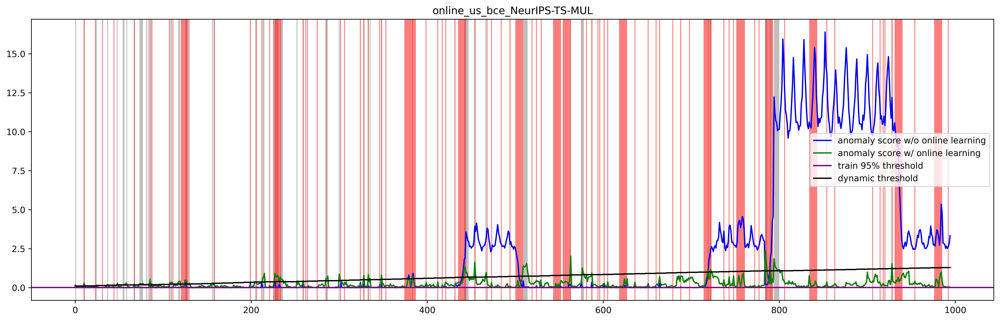

In [81]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
#plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q100, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plot_interval(plt, test_y[s:e])
plt.legend()
plt.show()

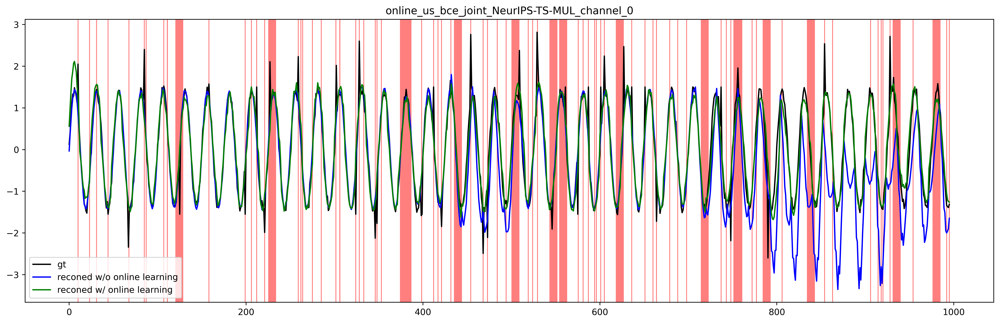

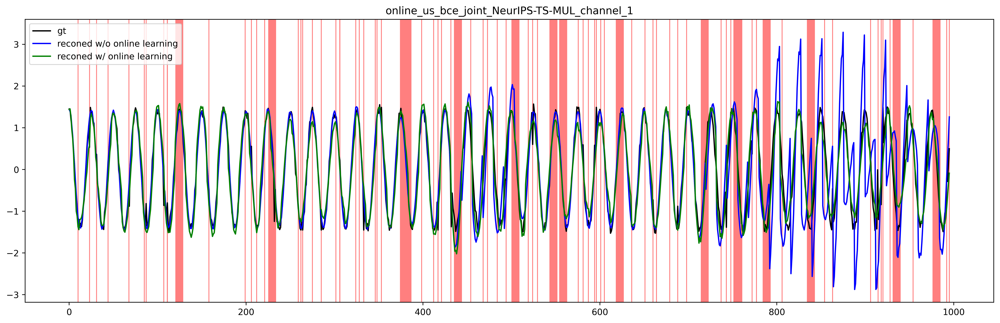

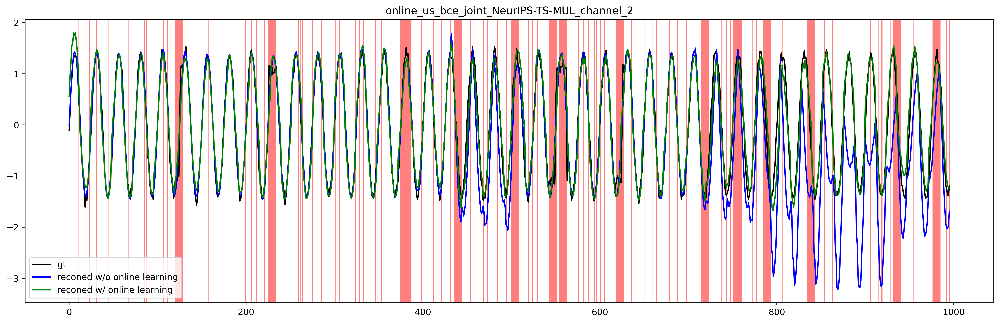

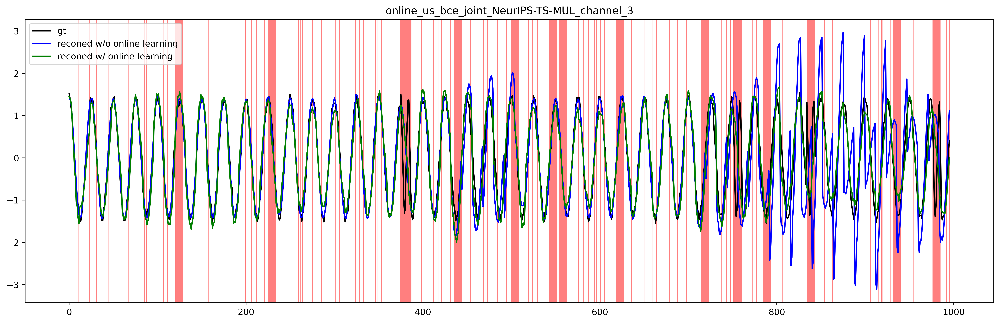

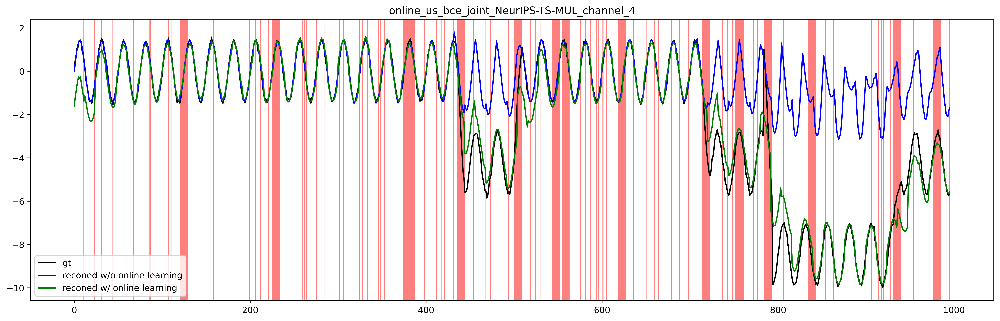

In [25]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)

### Just learn normals

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT", f"best.pth"))

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    Xhat = tester.model(X)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (A*mask).mean()
    recon_loss.backward()
    TT_optimizer.step()
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

In [ ]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=1)
plt.legend()
plt.show()

In [ ]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), linewidth=0.5, color="green", label="reconed w/ online learning")
    plt.plot(test_X[:, c], color="black", label="gt")
    plt.legend()
    plot_interval(plt, test_y)
    break

### src-tgt network

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_SWaT", f"best.pth"))


pretrained_model = tester.model
source_model = copy.deepcopy(pretrained_model)
target_model = copy.deepcopy(pretrained_model)
ema_updater = EMAUpdater(source_model, target_model, 0.99)

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([p for p in source_model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    with torch.no_grad():
        Xhat_tgt = target_model(X)
        E_tgt = (Xhat_tgt-X)**2
    Xhat_src = source_model(X)
    E_src = (Xhat_src-X)**2
    A = E_src.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat_src.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    
    if i>1000:
        flood_loss = torch.clamp(E_src-E_tgt, min=0).mean()
        flood_loss.backward()
    else:
        recon_loss = (A*mask).mean()
        recon_loss.backward()
    TT_optimizer.step()
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

In [ ]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=1)
plt.legend()
plt.show()

### Single + BCE + Label

In [ ]:
thr = torch.quantile(train_error_dist, 0.95).detach().item()
thr = torch.tensor(thr, requires_grad=True)
thr

In [ ]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_PSM", f"best.pth"))

In [ ]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 1e-03
TT_optimizer = torch.optim.SGD([thr]+[p for p in tester.model.parameters()], lr=lr)
bce = torch.nn.BCELoss()

Xs, Xhats = [], []
yhats = []
preds = []
As, thrs =[], []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    Xhat = tester.model(X)
    E = F.mse_loss(Xhat, X, reduction='none')
    A = E.mean(dim=2)
    ytilde = (A > thr).float()
    pred = (A > thr)
    
    # log source model outputs
    Xs.append(X)
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(thr.clone().detach().item())
    
    # learn new-normals and update threshold
    TT_optimizer.zero_grad()
    mask = (y == 0)
    yhat = torch.sigmoid((A - thr))
    cls_loss = bce(yhat, y.float())
    recon_loss = (A * mask).mean()
    loss = recon_loss + cls_loss
    loss.backward()
    TT_optimizer.step()
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

In [ ]:
# result summary
print(test_y.shape, preds.shape)
result = get_summary_stats(test_y, preds)
print(result)

In [ ]:
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_label_bce_joint_{args.dataset}")
plt.ylim([-1, 5])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, test_y[s:e])
plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plt.legend()
plt.show()

In [ ]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), linewidth=0.5, color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)